# does this work?

In [20]:
import sympy as sp
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.integrate import odeint
from IPython.display import HTML  # For displaying animations inline

# **AE370 Group Project 1: Double Pendulum**
## Aditya Srikanth, Nia Smith, Pratham Puskur

## **Introduction: Why the Double Pendulum Is Relevant in Engineering**

The **double pendulum** is a classic example of a nonlinear, coupled dynamic system that highlights the strength of **Lagrangian mechanics**. While traditional Newtonian analysis requires tracking forces and constraints on each mass individually, Lagrangian mechanics allows us to describe the entire system using **generalized coordinates** — in this case, the angular displacements $ \theta_1 $ and $ \theta_2 $.

### The Lagrangian Approach

The **Lagrangian** of a system is defined as:

$$
L = T - V
$$

where $ T $ is the total kinetic energy and $ V $ is the total potential energy. From this, the equations of motion are derived using the **Euler-Lagrange equations**:

$$
\frac{d}{dt} \left( \frac{\partial L}{\partial \dot{q}_i} \right) - \frac{\partial L}{\partial q_i} = 0
$$

This approach leads to a **system of differential equations** that fully characterizes the motion of the pendulum, even in the presence of nonlinear and coupled dynamics.

### Engineering Relevance

The double pendulum exemplifies many challenges that are common in engineering systems:

- **Nonlinearity**: The equations of motion are nonlinear, which is typical in real-world systems.
- **Coupling**: The motion of one link directly affects the other, just like in robotic arms or mechanical linkages.
- **Chaos**: The system is highly sensitive to initial conditions, making it a useful model in control and stability analysis.

Understanding the dynamics of the double pendulum helps engineers develop intuition and analytical techniques that scale to more complex systems such as:

- Robotic manipulators  
- Aerospace attitude dynamics  
- Suspension systems and structural dynamics

Studying the double pendulum using Lagrangian mechanics not only deepens understanding of physical behavior but also introduces engineers to **energy-based modeling**, **symbolic computation**, and **simulation**, all of which are foundational in modern engineering practice.


In [21]:
# Define symbols and Lagrangian (same as your original code)
t = sp.Symbol('t')
theta1 = sp.Function('theta1')(t)
theta2 = sp.Function('theta2')(t)
theta3 = sp.Function('theta3')(t)
dtheta1 = sp.diff(theta1, t)
dtheta2 = sp.diff(theta2, t)
dtheta3 = sp.diff(theta3, t)

m1, m2, m3, l1, l2, l3, g = sp.symbols('m1 m2 m3 l1 l2 l3 g')

# Positions, velocities, energies, and Lagrangian
x1 = l1 * sp.sin(theta1)
y1 = -l1 * sp.cos(theta1)
x2 = x1 + l2 * sp.sin(theta2)
y2 = y1 - l2 * sp.cos(theta2)
x3 = x2 + l3 * sp.sin(theta3)
y3 = y2 - l3 * sp.cos(theta3)

vx1 = sp.diff(x1, t)
vy1 = sp.diff(y1, t)
vx2 = sp.diff(x2, t)
vy2 = sp.diff(y2, t)
vx3 = sp.diff(x3, t)
vy3 = sp.diff(y3, t)

T1 = (1/2) * m1 * (vx1**2 + vy1**2)
T2 = (1/2) * m2 * (vx2**2 + vy2**2)
T3 = (1/2) * m3 * (vx3**2 + vy3**2)

V1 = m1 * g * y1
V2 = m2 * g * y2
V3 = m3 * g * y3

L = T1 + T2 + T3 - V1 - V2 - V3

# Euler-Lagrange equations
def lagrange_eq(L, q):
    dL_dq = sp.diff(L, q)
    dL_ddq = sp.diff(L, sp.diff(q, t))
    dt_dL_ddq = sp.diff(dL_ddq, t)
    return sp.simplify(dt_dL_ddq - dL_dq)

eom1 = lagrange_eq(L, theta1)
eom2 = lagrange_eq(L, theta2)
eom3 = lagrange_eq(L, theta3)

In [22]:
# Solve for theta1'' and theta2''
solutions = sp.solve(
    [sp.Eq(eom1, 0), sp.Eq(eom2, 0), sp.Eq(eom3, 0)],
    [sp.diff(theta1, t, 2), sp.diff(theta2, t, 2), sp.diff(theta3, t, 2)]
)
theta1_ddot = solutions[sp.diff(theta1, t, 2)]
theta2_ddot = solutions[sp.diff(theta2, t, 2)]
theta3_ddot = solutions[sp.diff(theta3, t, 2)]

In [23]:
# Lambdify the expressions for numerical evaluation
theta1_ddot_func = sp.lambdify(
    (theta1, theta2, theta3, dtheta1, dtheta2, dtheta3, g, l1, l2, l3, m1, m2, m3),
    theta1_ddot,
    modules='numpy'
)
theta2_ddot_func = sp.lambdify(
    (theta1, theta2, theta3, dtheta1, dtheta2, dtheta3, g, l1, l2, l3, m1, m2, m3),
    theta2_ddot,
    modules='numpy'
)

theta3_ddot_func = sp.lambdify(
    (theta1, theta2, theta3, dtheta1, dtheta2, dtheta3, g, l1, l2, l3, m1, m2, m3),
    theta3_ddot,
    modules='numpy'
)

# ODE function for scipy.integrate.odeint
def triple_pendulum_ode(y, t, g, l1, l2, l3, m1, m2, m3):
    theta1, theta2, theta3, omega1, omega2, omega3 = y
    return [
        omega1,
        omega2,
        omega3,
        theta1_ddot_func(theta1, theta2, theta3, omega1, omega2, omega3, g, l1, l2, l3, m1, m2, m3),
        theta2_ddot_func(theta1, theta2, theta3, omega1, omega2, omega3, g, l1, l2, l3, m1, m2, m3),
        theta3_ddot_func(theta1, theta2, theta3, omega1, omega2, omega3, g, l1, l2, l3, m1, m2, m3)
    ]

# Parameters and initial conditions
g_val = 9.81
l1_val, l2_val, l3_val = 1.0, 1.0, 1.0
m1_val, m2_val, m3_val = 1.0, 1.0, 1.0
y0 = y0 = [0.5, 0.75, 1, 0.0, 0.0, 0.0]  # Initial conditions
t_vals = np.linspace(0, 10, 300)  # Time points

# Solve the ODE
solution = odeint(
    triple_pendulum_ode,
    y0,
    t_vals,
    args=(g_val, l1_val, l2_val, l3_val, m1_val, m2_val, m3_val)
)

# Extract results
theta1_vals = solution[:, 0]
theta2_vals = solution[:, 1]
theta3_vals = solution[:, 2]

Solving reference solution...
Reference solution solved.
Solving coarse resolution solution...
Coarse solution solved.
Solving medium resolution solution...
Medium solution solved.
Solving fine resolution solution...
Fine solution solved.
Interpolating reference solution...
Computing error for coarse resolution...
Computing error for medium resolution...
Computing error for fine resolution...
Total error (coarse): 2.548072281842905e-07
Total error (medium): 2.4870994011515805e-07
Total error (fine): 3.1455292336762705e-07
Total error (reference): 1.0000000000000004e-10


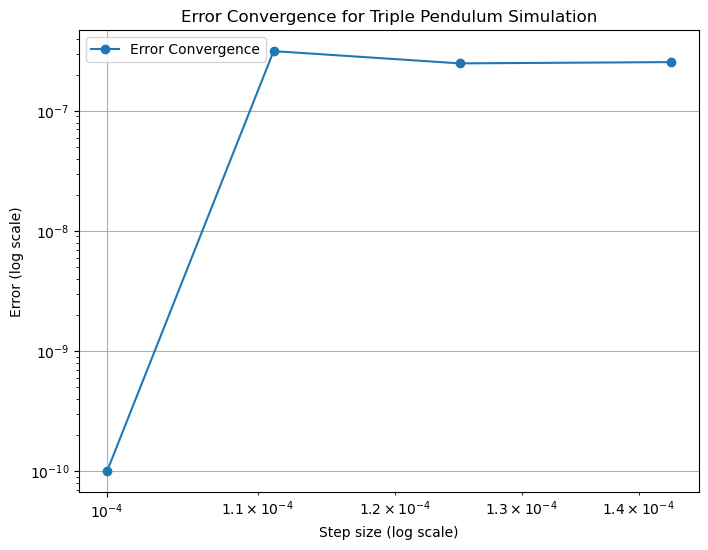

In [24]:
import numpy as np
from scipy.integrate import odeint
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt


# Modify time resolutions to match new step sizes
step_sizes = [1/7000, 1/8000, 1/9000, 1/10000]
t_vals_ref = np.linspace(0, 10, int(10/step_sizes[-1]))  # Reference time steps (smallest step size)
t_vals_coarse = np.linspace(0, 10, int(10/step_sizes[0]))  # Coarse time steps
t_vals_medium = np.linspace(0, 10, int(10/step_sizes[1]))  # Medium time steps
t_vals_fine = np.linspace(0, 10, int(10/step_sizes[2]))  # Fine time steps

# Solve reference solution (with highest resolution)
print("Solving reference solution...")
solution_ref = odeint(
    triple_pendulum_ode,
    y0,
    t_vals_ref,
    args=(g_val, l1_val, l2_val, l3_val, m1_val, m2_val, m3_val)
)
print("Reference solution solved.")

# Solve coarse, medium, and fine resolution solutions
print("Solving coarse resolution solution...")
solution_coarse = odeint(
    triple_pendulum_ode,
    y0,
    t_vals_coarse,
    args=(g_val, l1_val, l2_val, l3_val, m1_val, m2_val, m3_val)
)
print("Coarse solution solved.")

print("Solving medium resolution solution...")
solution_medium = odeint(
    triple_pendulum_ode,
    y0,
    t_vals_medium,
    args=(g_val, l1_val, l2_val, l3_val, m1_val, m2_val, m3_val)
)
print("Medium solution solved.")

print("Solving fine resolution solution...")
solution_fine = odeint(
    triple_pendulum_ode,
    y0,
    t_vals_fine,
    args=(g_val, l1_val, l2_val, l3_val, m1_val, m2_val, m3_val)
)
print("Fine solution solved.")

# Interpolate the reference solution for each time set
print("Interpolating reference solution...")
interp_ref = interp1d(t_vals_ref, solution_ref, axis=0, kind='cubic')

# Compute the error for each resolution
print("Computing error for coarse resolution...")
error_coarse = np.linalg.norm(solution_coarse - interp_ref(t_vals_coarse), axis=1)

print("Computing error for medium resolution...")
error_medium = np.linalg.norm(solution_medium - interp_ref(t_vals_medium), axis=1)

print("Computing error for fine resolution...")
error_fine = np.linalg.norm(solution_fine - interp_ref(t_vals_fine), axis=1)

# Adjust reference error to avoid log(0) issue
error_ref = np.zeros_like(t_vals_ref)
error_ref_total = np.mean(np.maximum(error_ref, 1e-10))  # Avoid log(0)

# Calculate total error for each resolution
error_coarse_total = np.mean(error_coarse)
error_medium_total = np.mean(error_medium)
error_fine_total = np.mean(error_fine)

# Debug output of error values
print(f"Total error (coarse): {error_coarse_total}")
print(f"Total error (medium): {error_medium_total}")
print(f"Total error (fine): {error_fine_total}")
print(f"Total error (reference): {error_ref_total}")

# Plot error convergence with the new step sizes
plt.figure(figsize=(8, 6))
plt.plot(step_sizes, [error_coarse_total, error_medium_total, error_fine_total, error_ref_total], marker='o', label='Error Convergence')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Step size (log scale)')
plt.ylabel('Error (log scale)')
plt.title('Error Convergence for Triple Pendulum Simulation')
plt.grid(True)
plt.legend()
plt.show()


In [ ]:
# initial conditions will drastically change scale of error overall, but because of how chaotic the system is, it doesn't converge in relation to step size, creating the same amount of error regardless of step size.

In [25]:
# First, make sure you have this at the top of your notebook
%matplotlib inline

# Then replace your animation code with this:
from IPython.display import HTML

# Convert angles to Cartesian coordinates
x1_vals = l1_val * np.sin(theta1_vals)
y1_vals = -l1_val * np.cos(theta1_vals)
x2_vals = x1_vals + l2_val * np.sin(theta2_vals)
y2_vals = y1_vals - l2_val * np.cos(theta2_vals)
x3_vals = x2_vals + l3_val * np.sin(theta3_vals)
y3_vals = y2_vals - l3_val * np.cos(theta3_vals)

# Set up the figure
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xlim(-3.5, 3.5)
ax.set_ylim(-3.5, 3.5)
ax.set_aspect('equal')
ax.grid()

# Initialize lines
line, = ax.plot([], [], 'o-', lw=2, markersize=8)
trace, = ax.plot([], [], 'r-', lw=1, alpha=0.5)  # Optional trace
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

def init():
    line.set_data([], [])
    trace.set_data([], [])
    time_text.set_text('')
    return line, trace, time_text

def animate(i):
    line.set_data(
        [0, x1_vals[i], x2_vals[i], x3_vals[i]],
        [0, y1_vals[i], y2_vals[i], y3_vals[i]]
    )
    # Update trace (last 100 points)
    trace.set_data(x3_vals[max(0, i-100):i], y3_vals[max(0, i-100):i])
    time_text.set_text(f'Time = {t_vals[i]:.2f}s')
    return line, trace, time_text

# Create animation - reduce frames if it's too slow
ani = FuncAnimation(
    fig, animate, frames=len(t_vals),
    init_func=init, blit=True, interval=20
)

plt.title('Double Pendulum Animation')
plt.close()  # This prevents static display of the figure

# Display the animation
HTML(ani.to_jshtml())